# Preprocessing générique des images

## Utilisable avec toutes les libs

### Permet d'obtenir un dossier "balanced_image_train" avec:
- 1000 images par catégories (27)
- des traitements pour 30% d'entre elles : flip horizontal / vertical, zoom, brightness

In [1]:
import os
import shutil
import random
from PIL import Image, ImageEnhance
from sklearn.utils import resample
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
import itertools
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectPercentile
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, make_scorer
from sklearn.pipeline import Pipeline
from xgboost import XGBClassifier
import umap.umap_ as umap
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array

# options d'affichage
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [2]:
# Import du dataframe qui contient les références images

data = pd.read_csv('../data/csv_files/img-data.csv')
data.head()

print("Répartition des catégories\n:", data['prdtypecode'].value_counts())

Répartition des catégories
: prdtypecode
2583    10209
1560     5073
1300     5045
2060     4993
2522     4989
1280     4870
2403     4774
2280     4760
1920     4303
1160     3953
1320     3241
10       3116
2705     2761
1140     2671
2582     2589
40       2508
2585     2496
1302     2491
1281     2070
50       1681
2462     1421
2905      872
60        832
2220      824
1301      807
1940      803
1180      764
Name: count, dtype: int64


In [3]:
# Sampling des images (1000 img par catégorie)

data_sampled = data.groupby('prdtypecode').apply(lambda x: x.sample(n = min(1000, len(x)), random_state = 42)).reset_index(drop = True)
print(data_sampled['prdtypecode'].value_counts())


prdtypecode
10      1000
40      1000
2705    1000
2585    1000
2583    1000
2582    1000
2522    1000
2462    1000
2403    1000
2280    1000
2060    1000
1920    1000
1560    1000
1320    1000
1302    1000
1300    1000
1281    1000
1280    1000
1160    1000
1140    1000
50      1000
2905     872
60       832
2220     824
1301     807
1940     803
1180     764
Name: count, dtype: int64


C:\Users\Louis Valentin\AppData\Local\Temp\ipykernel_27312\4136188411.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  data_sampled = data.groupby('prdtypecode').apply(lambda x: x.sample(n = min(1000, len(x)), random_state = 42)).reset_index(drop = True)


In [4]:
# Data augmentation

def img_augmentation(image):
    """
    - desc: Applique plusieurs opérations de transformation à une image, aléatoirement
    - vparams: img - image a traiter
    - returns: image traitée
    """

    # Rotation
    if random.random() > 0.5:
        image = image.rotate(random.uniform(-30, 30))
    
    # Zoom
    if random.random() > 0.5:
        zoom_factor = random.uniform(0.8, 1.2)
        width, height = image.size
        x = int((width * zoom_factor - width) / 2)
        y = int((height * zoom_factor - height) / 2)
        image = image.crop((x, y, width - x, height - y))
        image = image.resize((width, height), Image.Resampling.LANCZOS)
    
    # Flip horizontal
    if random.random() > 0.5:
        image = image.transpose(Image.FLIP_LEFT_RIGHT)

    # Flip vertical
    if random.random() > 0.5:
        image = image.transpose(Image.FLIP_TOP_BOTTOM)
    
    # Brightness
    if random.random() > 0.5:
        enhancer = ImageEnhance.Brightness(image)
        image = enhancer.enhance(random.uniform(0.7, 1.3))
    
    return image


In [5]:
def copy_and_resample_images(group, augment_percentage = 0.3):
    """
    - desc : Oversample les images d'un prdtypecode, les copie dans le dossier "balanced_dir"
    avec des noms uniques et applique des augmentations de données sur un pourcentage donné.
    - group : lignes d'images pour un prdtypecode donné
    - augment_perc : pourcentage d'images qui recevront un traitement d'augmentation
    """

    balanced_dir = '../data/processed/balanced_image_train'
    os.makedirs(balanced_dir, exist_ok = True)

    # Oversampling pour atteindre max_samples
    max_samples = 1000
    resampled_group = resample(group, replace = True, n_samples = max_samples, random_state=42)
    
    # Nouveaux paths img
    new_paths = []
    
    # Compteur pour générer copies des img
    copy_counters = {}
    
    for index, row in resampled_group.iterrows():
        src = os.path.join('../../data/images/image_train', row['image name'])
        dst_dir = os.path.join(balanced_dir, str(row['prdtypecode']))
        os.makedirs(dst_dir, exist_ok=True)
        
        # nom de fichier avec / sans extension
        file_name, file_ext = os.path.splitext(os.path.basename(row['image name']))
        
        # MAJ du compteur pour l'image
        if row['image name'] not in copy_counters:
            copy_counters[row['image name']] = 1
        else:
            copy_counters[row['image name']] += 1
        
        # Création nom fichier unique
        unique_suffix = f"_{copy_counters[row['image name']]}"
        unique_file_name = f"{file_name}{unique_suffix}{file_ext}"
        
        dst = os.path.join(dst_dir, unique_file_name)
        
        # img loading
        image = Image.open(src)
        
        # data augmentation
        if random.random() < augment_percentage:
            image = img_augmentation(image)
        
        # img save
        image.save(dst)
        
        # MAJ new_path avec nouveau path créé
        new_paths.append(os.path.relpath(dst, start='../../data/images'))
    
    # MAJ dataframe
    resampled_group['image name'] = new_paths
    
    return resampled_group


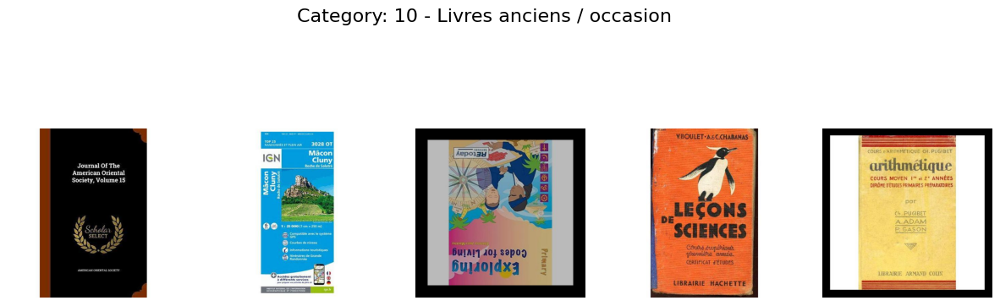

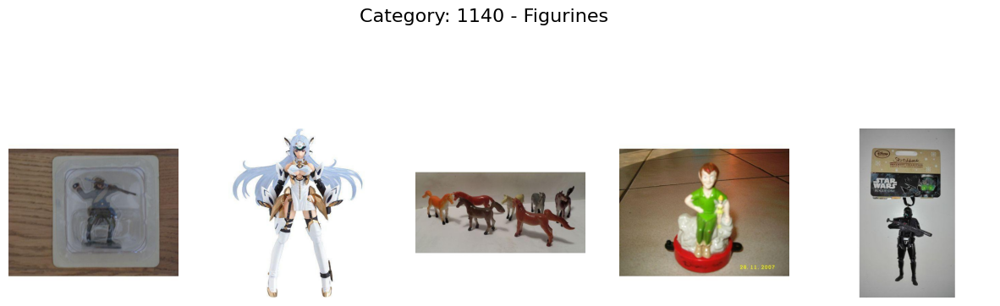

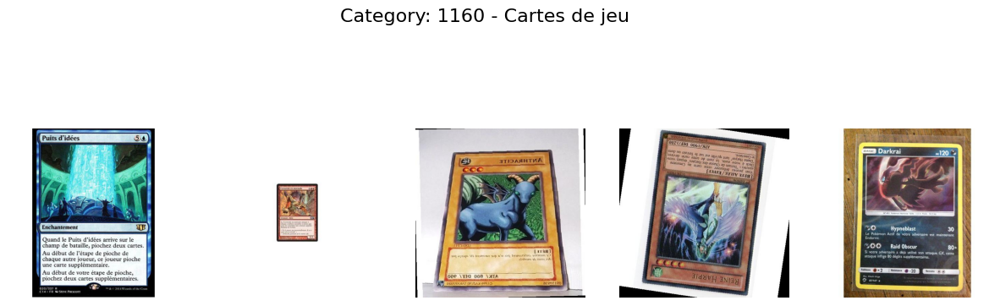

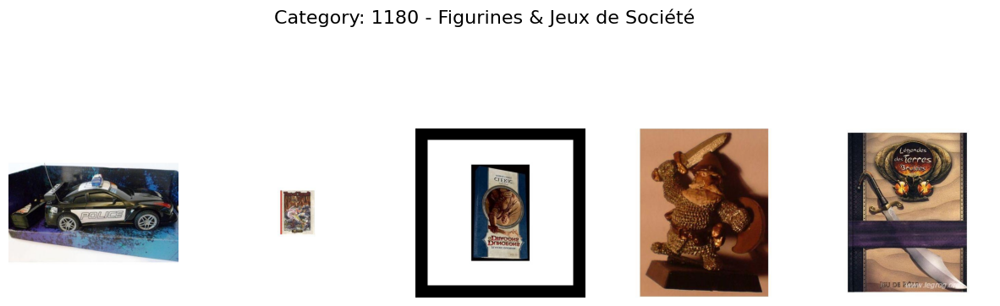

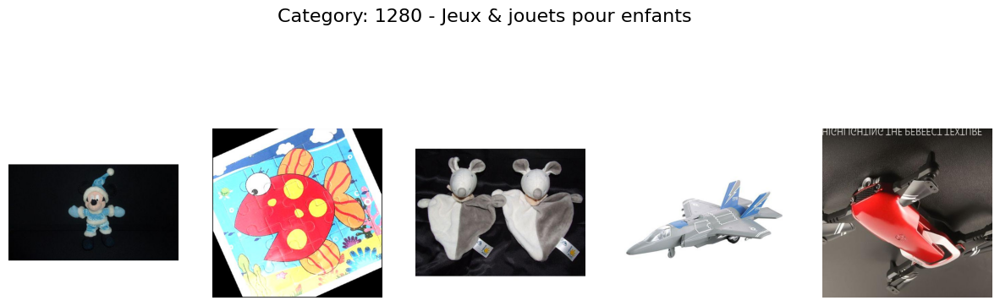

...

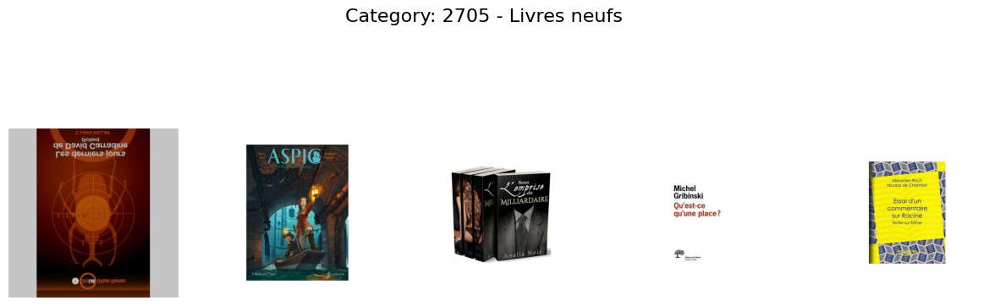

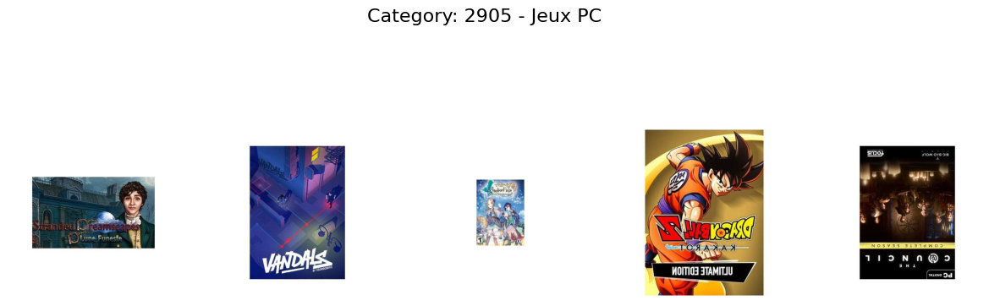

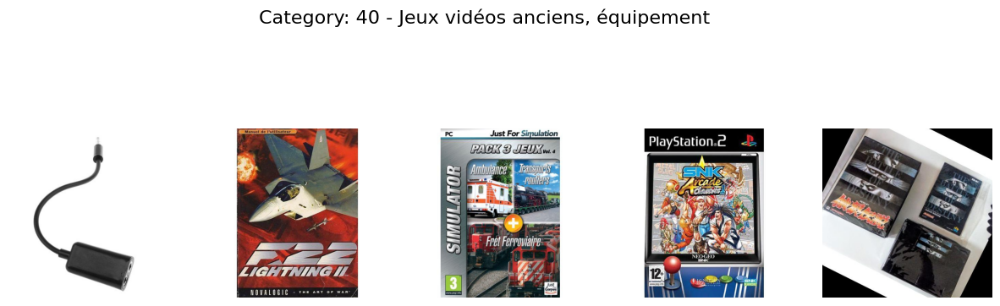

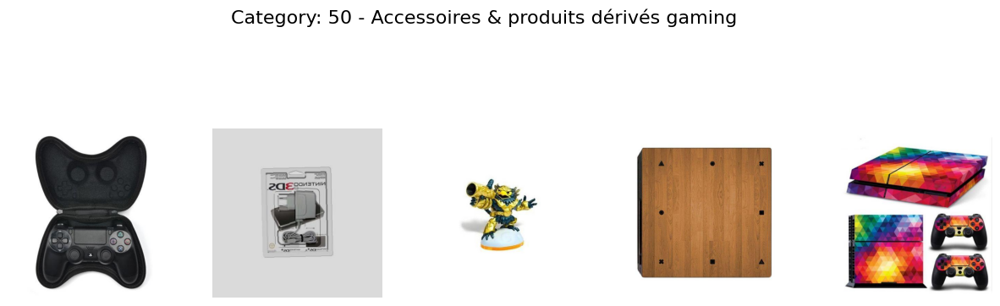

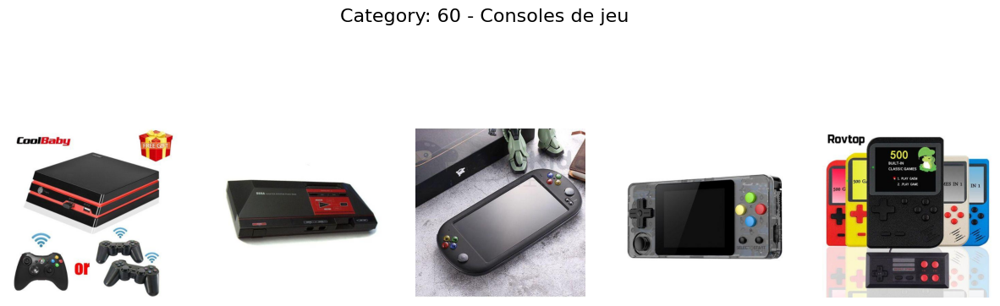

In [6]:
def show_images_per_category(base_dir, num_images = 5):
    """
    - desc : Affiche un nombre donné d'images par catégorie à partir du dossier de base.
    - params:
     -> base_dir : dossier de base
     -> num_images : nombre d'images à afficher par catégorie
    """

    # dict "prdtypecode -> désignation textuelle"
    category_to_text = dict(zip(data['prdtypecode'], data['désignation textuelle']))

    # parcours chaque dossier (cat) dans base_dir
    for category in os.listdir(base_dir):
        category_dir = os.path.join(base_dir, category)
        
        if os.path.isdir(category_dir):
            # liste des images du dossier
            image_files = os.listdir(category_dir)
            # sélection aléatoire de num_images
            selected_images = random.sample(image_files, min(num_images, len(image_files)))
            # designation textuelle de la categorie
            text_designation = category_to_text.get(int(category), "Unknown")
            # Affichage
            plt.figure(figsize=(15, 5))
            plt.suptitle(f"Category: {category} - {text_designation}", fontsize = 16)
            for i, image_file in enumerate(selected_images):
                img_path = os.path.join(category_dir, image_file)
                img = Image.open(img_path)
                plt.subplot(1, num_images, i + 1)
                plt.imshow(img)
                plt.axis('off')
            plt.suptitle(f"Category: {category} - {text_designation}", fontsize = 16)
            plt.show()

balanced_dir = '../data/processed/balanced_image_train'
show_images_per_category(balanced_dir, num_images = 5)



# Preprocessing des images avec keras pour les modèles Tensorflow (ResNet, EfficientNet, etc.)

In [7]:
# Lecture du fichier csv conternant des infos sur les images

data = pd.read_csv('../data/csv_files/img-data.csv')
display(data.head())
print(data['prdtypecode'].value_counts())


,designation,description,productid,imageid,image name,image size in bits,prdtypecode,désignation textuelle,catégorie niv 1
0,Olivia: Personalisiertes Notizbuch / 150 Seite...,NaN,3804725264,1263597046,image_1263597046_product_3804725264.jpg,14010,10,Livres anciens / occasion,Littérature
1,Journal Des Arts (Le) N° 133 Du 28/09/2001 - L...,NaN,436067568,1008141237,image_1008141237_product_436067568.jpg,14854,2280,"journaux, revues, magazines anciens",Littérature
2,Grand Stylet Ergonomique Bleu Gamepad Nintendo...,PILOT STYLE Touch Pen de marque Speedlink est ...,201115110,938777978,image_938777978_product_201115110.jpg,6898,50,Accessoires & produits dérivés gaming,Jeux Vidéos
3,Peluche Donald - Europe - Disneyland 2000 (Mar...,NaN,50418756,457047496,image_457047496_product_50418756.jpg,14404,1280,Jeux & jouets pour enfants,Jeux de société & Jouets
4,La Guerre Des Tuques,Luc a des id&eacute;es de grandeur. Il veut or...,278535884,1077757786,image_1077757786_product_278535884.jpg,20435,2705,Livres neufs,Littérature


prdtypecode
2583    10209
1560     5073
1300     5045
2060     4993
2522     4989
1280     4870
2403     4774
2280     4760
1920     4303
1160     3953
1320     3241
10       3116
2705     2761
1140     2671
2582     2589
40       2508
2585     2496
1302     2491
1281     2070
50       1681
2462     1421
2905      872
60        832
2220      824
1301      807
1940      803
1180      764
Name: count, dtype: int64


In [8]:
# Sampling des images (1500 par catégorie)
max_samples = 1500
data_sampled = data.groupby('prdtypecode').apply(lambda x: x.sample(n = min(max_samples, len(x)), random_state = 42)).reset_index(drop = True)
print(data_sampled['prdtypecode'].value_counts())


prdtypecode
10      1500
1320    1500
2705    1500
2585    1500
2583    1500
2582    1500
2522    1500
2403    1500
2280    1500
2060    1500
1920    1500
40      1500
1560    1500
1302    1500
1300    1500
1281    1500
1280    1500
1160    1500
1140    1500
50      1500
2462    1421
2905     872
60       832
2220     824
1301     807
1940     803
1180     764
Name: count, dtype: int64


C:\Users\Louis Valentin\AppData\Local\Temp\ipykernel_27312\3698373136.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  data_sampled = data.groupby('prdtypecode').apply(lambda x: x.sample(n = min(max_samples, len(x)), random_state = 42)).reset_index(drop = True)


In [9]:
# Générateur d'img avec augmentations
datagen = ImageDataGenerator(
    rescale = 1./255,
    shear_range = 0.2,      
    zoom_range = 0.2,             
    horizontal_flip = True,
    validation_split = 0.2        
)

# Chargement des img pour le train
train_generator = datagen.flow_from_directory(
    balanced_dir,
    target_size=(224, 224),
    batch_size = 32,
    class_mode = 'categorical',
    subset = 'training'
)

# Chargement des img pour le test
validation_generator = datagen.flow_from_directory(
    balanced_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation'
)


Found 21600 images belonging to 27 classes.
Found 5400 images belonging to 27 classes.


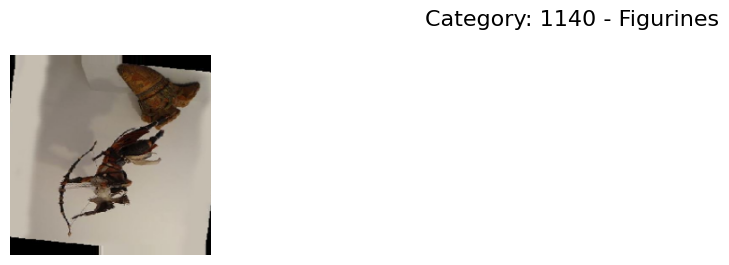

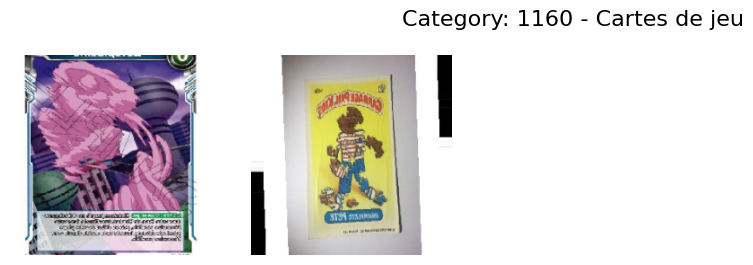

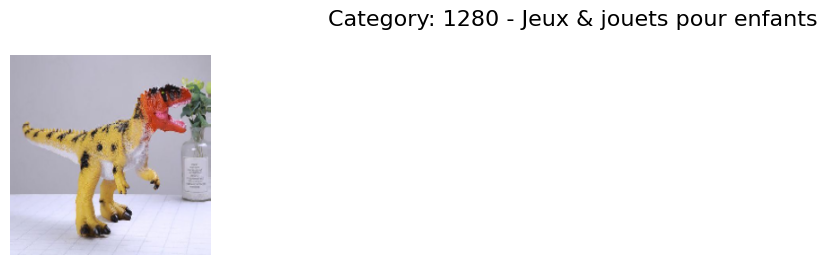

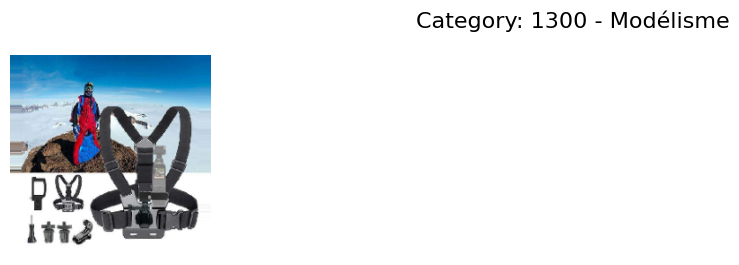

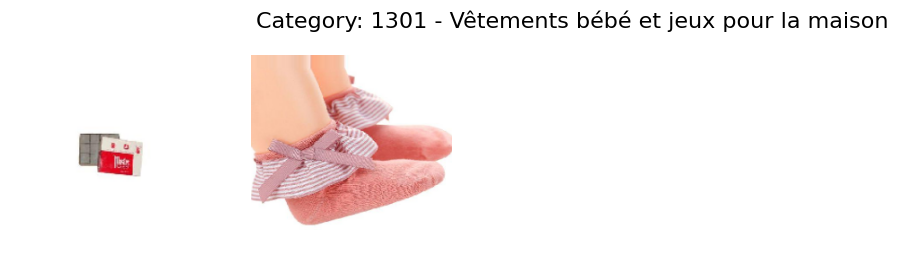

...

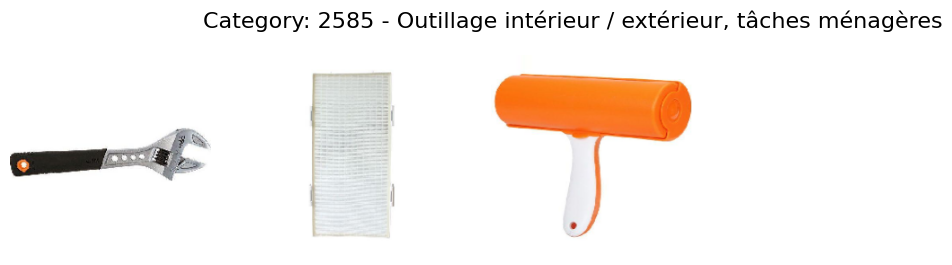

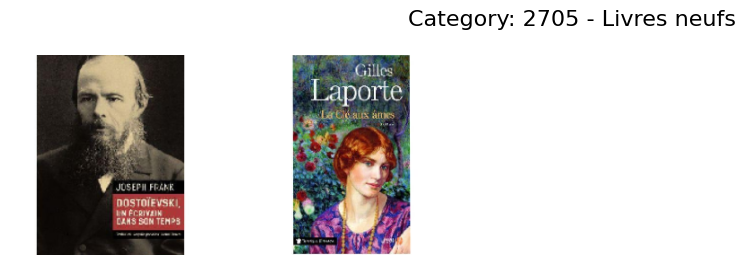

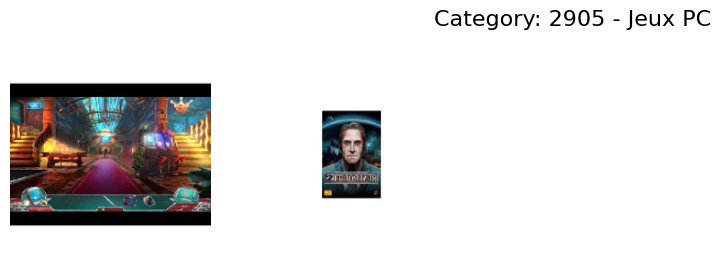

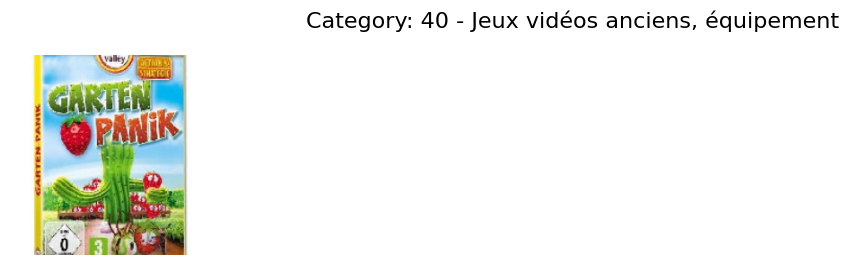

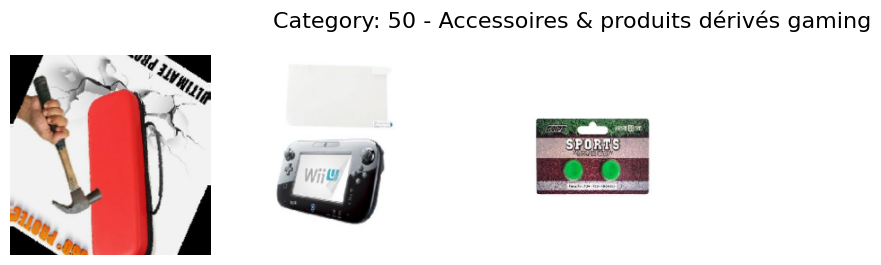

In [10]:
def plot_images_from_generator(generator, num_images_per_class = 5, category_to_text = None):
    '''
    - desc : Affiche une portion des images constituées depuis le generator (ImageDataGenerator)
    - params:
     -> num_images_per_class : nb d'images par classe à afficher (par défaut 5)
     -> category_to_text = dict prdtypecode -> désignation textuelle
    '''
    # batch img + étiquette from generator
    x, y = next(generator)
    # conversion étiquette -> catégories
    y_classes = np.argmax(y, axis = 1)
    # nom des classes depuis le générateur
    class_labels = list(generator.class_indices.keys())
    # dict stockage img par catégorie
    images_by_class = {class_label: [] for class_label in class_labels}
    # classer img batch par catégorie
    for i in range(len(x)):
        class_name = class_labels[y_classes[i]]
        if len(images_by_class[class_name]) < num_images_per_class:
            images_by_class[class_name].append(x[i])
    # Affichage
    for class_name, images in images_by_class.items():
        if images:  # S'il y a des images pour cette classe
            plt.figure(figsize = (15, 3))
            # designation textuelle associée à la catégorie
            text_designation = category_to_text.get(int(class_name), "Unknown")
            # formatage du titre
            plt.suptitle(f"Category: {class_name} - {text_designation}", fontsize = 16) 
            for i in range(len(images)):
                plt.subplot(1, num_images_per_class, i + 1)
                plt.imshow(images[i])
                plt.axis('off')
         
# dict prdtypecode -> designation textuelle
category_to_text = dict(zip(data['prdtypecode'], data['désignation textuelle']))

plot_images_from_generator(train_generator, num_images_per_class = 5, category_to_text = category_to_text)


# Réduction PCA + Decision Tree Classifier (Random Forest, XGBoost)

## Preprocessing 1 : Redimensionnement

#### Cette étape consiste à: 
- passer d'images de 500x500 pixels à 64x64 pixels
- sélectionner 500 images par catégorie (27) soit 13500 images
- Passer les images en niveaux de gris

In [4]:
# path du dossier images
base_dir = "../../data/images/balanced_image_train"
# taille des img
image_size = (64, 64)
# listes pour img et labels
images = []
labels = []
# max images à sélectionner par catégorie
max_img = 500
# dict comptage img par catégorie
image_count = {}
# Chargement images et labels
for category in os.listdir(base_dir):
    category_dir = os.path.join(base_dir, category)
    if os.path.isdir(category_dir):
        image_count[category] = 0
        for file_name in os.listdir(category_dir):
            if image_count[category] < max_img:  # Limiter à 1000 images par catégorie
                img_path = os.path.join(category_dir, file_name)
                img = load_img(img_path, target_size = image_size, color_mode = 'grayscale')
                img_array = img_to_array(img)
                images.append(img_array)
                labels.append(category)
                image_count[category] += 1
            else:
                break

# Conversion en tableaux numpy
images = np.array(images)
labels = np.array(labels)
# Redimensionnement img 2D
images = images.reshape(images.shape[0], -1)

print(f"Nb total d'images chargées: {len(images)}")
for category, count in image_count.items():
    print(f"Category {category}: {count} images loaded")
print("imgs shape : ", images.shape)
print("labels shape : ", labels.shape)

Nb total d'images chargées: 13500
Category 10: 500 images loaded
Category 1140: 500 images loaded
Category 1160: 500 images loaded
Category 1180: 500 images loaded
Category 1280: 500 images loaded
Category 1281: 500 images loaded
Category 1300: 500 images loaded
Category 1301: 500 images loaded
Category 1302: 500 images loaded
Category 1320: 500 images loaded
Category 1560: 500 images loaded
Category 1920: 500 images loaded
Category 1940: 500 images loaded
Category 2060: 500 images loaded
Category 2220: 500 images loaded
Category 2280: 500 images loaded
Category 2403: 500 images loaded
Category 2462: 500 images loaded
Category 2522: 500 images loaded
Category 2582: 500 images loaded
Category 2583: 500 images loaded
Category 2585: 500 images loaded
Category 2705: 500 images loaded
Category 2905: 500 images loaded
Category 40: 500 images loaded
Category 50: 500 images loaded
Category 60: 500 images loaded
imgs shape :  (13500, 4096)
labels shape :  (13500,)


## Affichage du preprocessing

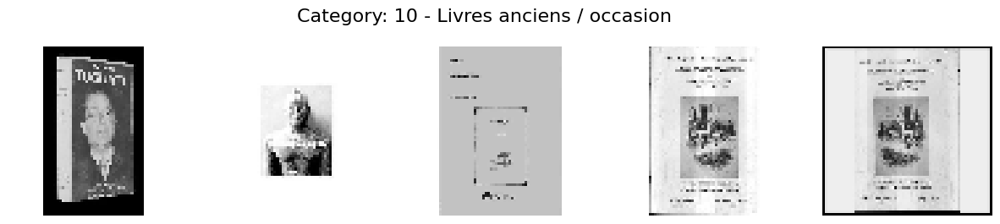

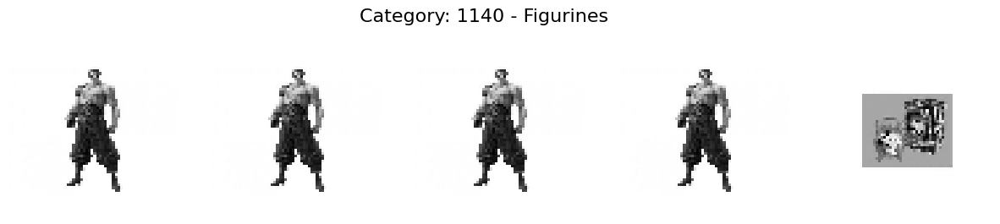

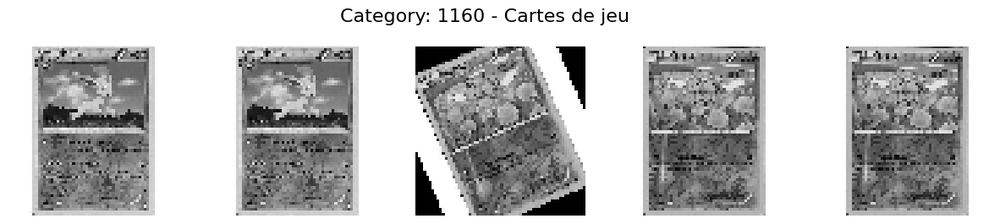

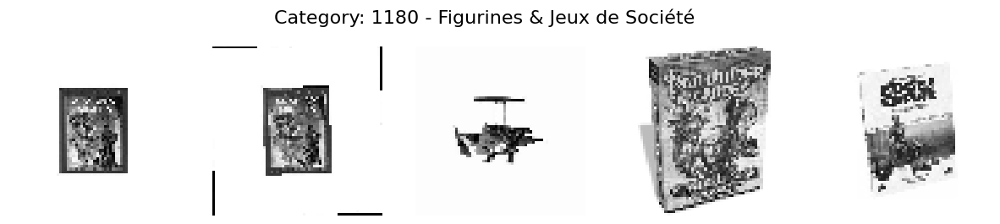

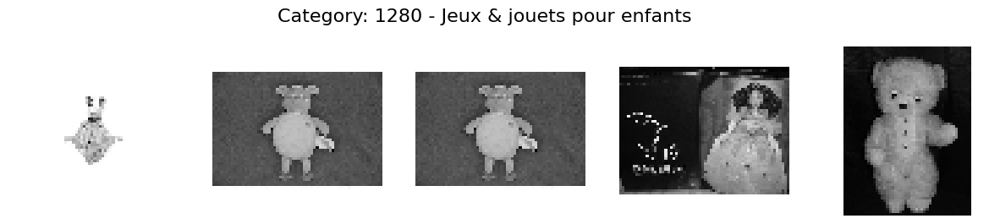

...

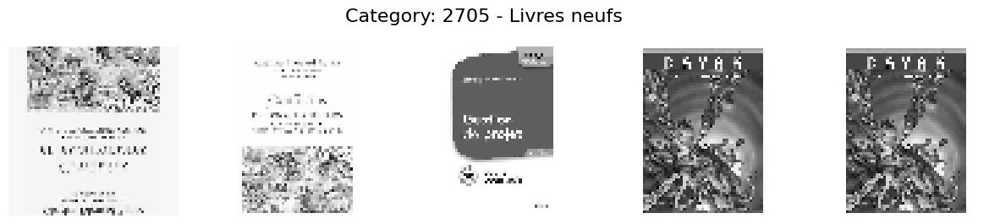

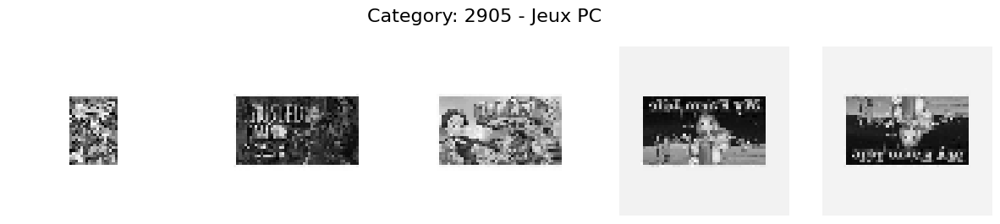

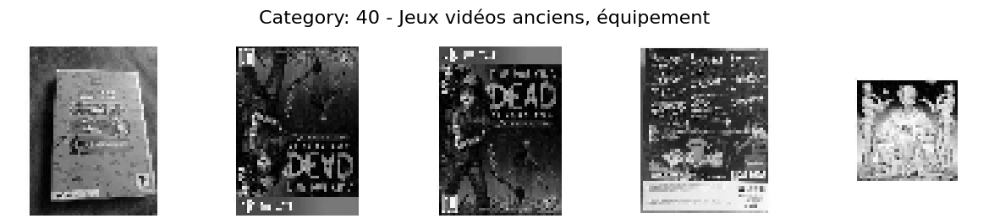

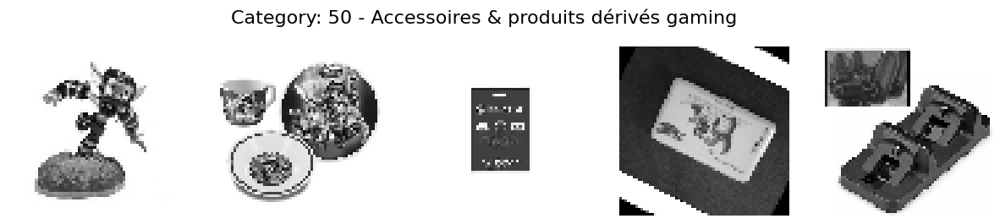

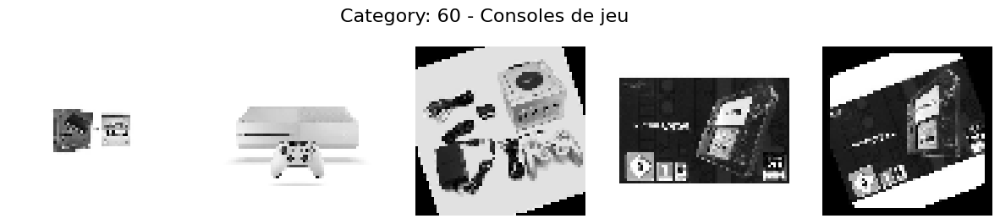

In [7]:
# Afficher les images réduites

# Taille originale des images
original_shape = (64, 64, 1)

# nb max d'images à afficher
max_img_display = 5

# dict prdtypecode -> designation textuelle
category_to_text = dict(zip(data['prdtypecode'], data['désignation textuelle']))

# dict imgs par catégorie
images_by_category = defaultdict(list)
# replissage du dict imgs par catégorie
for img, label in zip(images, labels):
    if len(images_by_category[label]) < max_img_display:
        images_by_category[label].append(img)

# Affichage
for category, imgs in images_by_category.items():
    plt.figure(figsize = (15, 3))
    # designation textuelle associée à la catégorie
    text_designation = category_to_text.get(int(category), "Unknown")
    plt.suptitle(f"Category: {category} - {text_designation}", fontsize = 16)
    
    for i in range(len(imgs)):
        reshaped_img = imgs[i].reshape(original_shape)
        plt.subplot(1, 5, i + 1)
        plt.imshow(reshaped_img.astype("uint8"), cmap = 'gray')
        plt.axis('off')
    
    plt.show()


In [10]:
df = pd.read_csv("../data/csv_files/img-text-clean-data.csv")
display(df.head())

,designation,description,productid,imageid,image name,image size in bits,prdtypecode,désignation textuelle,catégorie niv 1,desi_desc_cleaned
0,Olivia: Personalisiertes Notizbuch / 150 Seite...,NaN,3804725264,1263597046,image_1263597046_product_3804725264.jpg,14010,10,Livres anciens / occasion,Littérature,olivia personalisiertes notizbuch seiten punkt...
1,Journal Des Arts (Le) N° 133 Du 28/09/2001 - L...,NaN,436067568,1008141237,image_1008141237_product_436067568.jpg,14854,2280,"journaux, revues, magazines anciens",Littérature,journal arts art marche salon art asiatique pa...
2,Grand Stylet Ergonomique Bleu Gamepad Nintendo...,PILOT STYLE Touch Pen de marque Speedlink est ...,201115110,938777978,image_938777978_product_201115110.jpg,6898,50,Accessoires & produits dérivés gaming,Jeux Vidéos,stylet ergonomique bleu gamepad nintendo wii s...
3,Peluche Donald - Europe - Disneyland 2000 (Mar...,NaN,50418756,457047496,image_457047496_product_50418756.jpg,14404,1280,Jeux & jouets pour enfants,Jeux de société & Jouets,peluche donald europe disneyland marionnette d...
4,La Guerre Des Tuques,Luc a des id&eacute;es de grandeur. Il veut or...,278535884,1077757786,image_1077757786_product_278535884.jpg,20435,2705,Livres neufs,Littérature,guerre tuques luc ideacute grandeur veut organ...
